# MDI220
# Statistics

# Project 

This is the project for the course on statistics.

You must fill this notebook and upload it on eCampus, **including figures**. Please make sure that it runs **without erros**.

You can work in teams but the final notebook, including text and code, must be **yours**. Any copy-pasting across students is strictly forbidden.

Please provide **concise answers** and **concise code**, with comments when appropriate.

## Your name: Marchetti Pierre

## Imports

Please do **not** import any other library.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
from scipy.stats import norm, chi2, gaussian_kde

In [3]:
import seaborn as sns

## Data

We consider the **daily electric power consumption** (in MW) in France in the period 2013-2023. The dataset is available on **eCampus**. 

Detailed information on this dataset is available [here](https://www.data.gouv.fr/fr/datasets/consommation-quotidienne-brute-regionale/).

In [4]:
# do not modify this cell
filename = 'power_consumption.csv'
df = pd.read_csv(filename)

In [5]:
df.head()

,region,date,consumption
0,Auvergne-Rhône-Alpes,2013-01-01,7560
1,Auvergne-Rhône-Alpes,2013-01-02,8700
2,Auvergne-Rhône-Alpes,2013-01-03,9367
3,Auvergne-Rhône-Alpes,2013-01-04,9133
4,Auvergne-Rhône-Alpes,2013-01-05,8283


In [6]:
regions = list(df.region.unique())

In [7]:
regions

['Auvergne-Rhône-Alpes',
 'Bourgogne-Franche-Comté',
 'Bretagne',
 'Centre-Val de Loire',
 'Grand Est',
 'Hauts-de-France',
 'Normandie',
 'Nouvelle-Aquitaine',
 'Occitanie',
 'Pays de la Loire',
 "Provence-Alpes-Côte d'Azur",
 'Île-de-France']

In [8]:
# average consumption per region
df[["region", "consumption"]].groupby("region").mean().astype(int)

,consumption
region,
Auvergne-Rhône-Alpes,7495
Bourgogne-Franche-Comté,2416
Bretagne,2546
Centre-Val de Loire,2139
Grand Est,5155
Hauts-de-France,5726
Normandie,3168
Nouvelle-Aquitaine,4925
Occitanie,4266


In [9]:
# average consumption in France (MW)
df[["region", "consumption"]].groupby("region").mean().sum().astype(int)

consumption    53582
dtype: int32

In [10]:
# selection of a region
region = "Bretagne"
df_region = df[df.region == region]

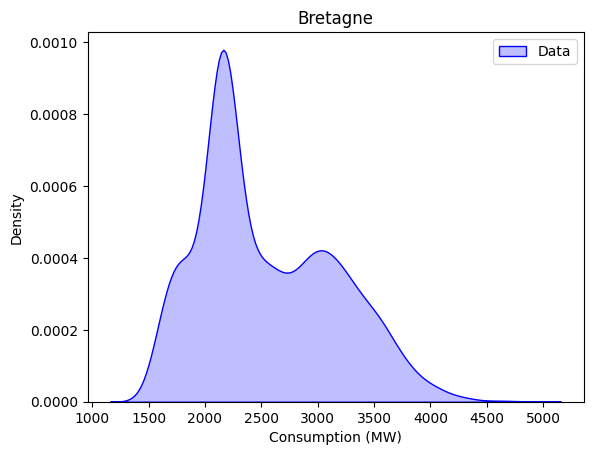

In [11]:
# density (with kde = kernel density estimation)
sns.kdeplot(data=df_region, x="consumption", label="Data", color='blue', fill=True)
plt.title(region)
plt.xlabel("Consumption (MW)")
plt.legend() 
plt.show()

## A. Parameter estimation

In all the project, the daily power consumptions are assumed to be i.i.d., with a Gaussian distribution. 

We use the following estimators for the mean and the variance, given $n$ observations $x_1,\ldots,x_n$:
$$
\hat \mu = \frac 1 n \sum_{i=1}^n x_i\quad \hat{\sigma^2} = \frac 1 {n-1}\sum_{i=1}^n (x_i - \hat \mu)^2
$$
The corresponding estimate of the standard deviation is:
$$
\hat \sigma = \sqrt{\hat{\sigma^2}}
$$

Consider the region Bretagne. 

1. Show that the estimators for the mean and the variance are unbiased.

Your answer:

Let's calculate the expected value of the mean, denoted as $\mathbb{E}(\hat{\mu})$:

\begin{equation}
\mathbb{E}(\hat{\mu}) = \mathbb{E}\left(\frac{1}{n} \sum_{i=1}^{n} x_i\right) = \frac{1}{n} \sum_{i=1}^{n} \mathbb{E}(x_i) = \mu
\end{equation}

Now, let's calculate the expected value of the variance, denoted as $\mathbb{E}(\hat{\sigma}^2)$:

\begin{equation}
\begin{split}
\mathbb{E}(\hat{\sigma}^2) &= \mathbb{E}\left(\frac{1}{n-1} \sum_{i=1}^{n} (x_i - \hat{\mu})^2\right) \\
&= \frac{1}{n-1} \sum_{i=1}^{n} \mathbb{E}((x_i - \hat{\mu})^2) \\
&= \frac{1}{n-1} \sum_{i=1}^{n} (\mathbb{E}(x_i^2) - 2\mathbb{E}(x_i \hat{\mu}) + \mathbb{E}(\hat{\mu}^2)) \\
&= \sigma^2
\end{split}
\end{equation}

Thus, the estimators for the mean and the variance are unbiased.

2. Give the values obtained for the mean and the standard deviation using these estimators.

In [12]:
consumption_values = list(df_region.consumption)
n = len(consumption_values)

# Calculate the mean
mean = np.mean(consumption_values)

# Calculate the standard deviation
L = np.array(n*[mean])
variance = np.sum((consumption_values - L)**2)/(n - 1)
std_deviation = np.sqrt(variance)

print("The mean is: " + str(mean) + " , the standard deviation is: " + str(std_deviation))

The mean is: 2546.536155666579 , the standard deviation is: 604.9429842099315


3. Generate new data using the corresponding Gaussian model, with the same number of samples.

In [13]:
new_consumption_values = np.random.normal(np.array(n*[mean]),np.array(n*[std_deviation]))

4. Plot the *kde* (kernel density estimate) of real data and the *kde* of generated data on the same figure.

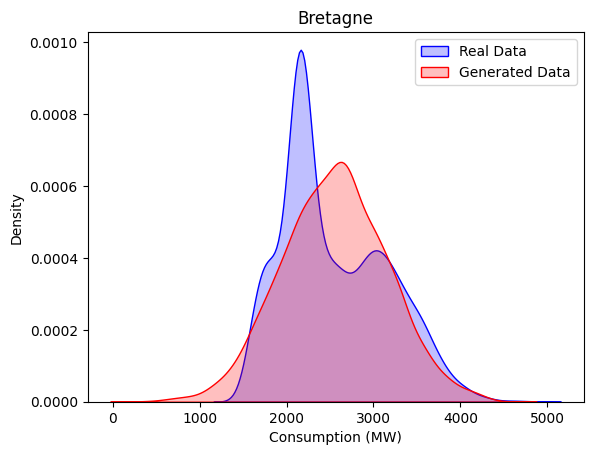

In [14]:
# Real data
sns.kdeplot(data=df_region, x="consumption", label="Real Data", color='blue', fill=True)

# Generated data
df_region_generated = pd.DataFrame({'consumption': new_consumption_values})
sns.kdeplot(df_region_generated, x="consumption", label="Generated Data", color='red', fill=True)

plt.title(region)
plt.xlabel("Consumption (MW)")
plt.legend()
plt.show()

5. Do the same for the days corresponding to winter (from December 22 to March 21), after updating the model.

The mean is: 3214.1782077393077 , the standard deviation is: 409.4763740819989


C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\2937961361.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  w_consumption_values = df_region[w_mask]['consumption']


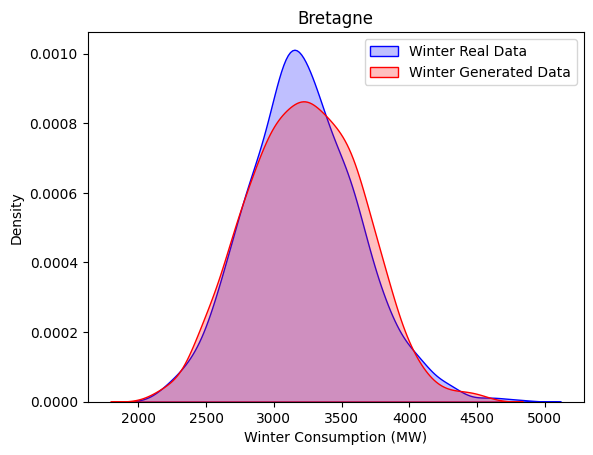

In [15]:
# Updating the model
df['date'] = pd.to_datetime(df['date'])
w_mask = ( (df['date'].dt.month < 3) | ((df['date'].dt.month == 3) & (df['date'].dt.day <= 21)) | ((df['date'].dt.month == 12) & (df['date'].dt.day >= 22)) )
w_consumption_values = df_region[w_mask]['consumption']

w_n = len(w_consumption_values)

# Calculate the mean
w_mean = np.mean(w_consumption_values)

# Calculate the standard deviation
w_L = np.array(w_n*[w_mean])
w_variance = np.sum((w_consumption_values - w_L)**2)/(w_n - 1)
w_std_deviation = np.sqrt(w_variance)

print("The mean is: " + str(w_mean) + " , the standard deviation is: " + str(w_std_deviation))

# Generate new data
w_new_consumption_values = np.random.normal(np.array(w_n*[w_mean]),np.array(w_n*[w_std_deviation]))

# Real data
df_region_w = pd.DataFrame({'consumption': w_consumption_values})
sns.kdeplot(df_region_w, x="consumption", label="Winter Real Data", color='blue', fill=True)

# Generated data
df_region_w_generated = pd.DataFrame({'consumption': w_new_consumption_values})
sns.kdeplot(df_region_w_generated, x="consumption", label="Winter Generated Data", color='red', fill=True)

plt.title(region)
plt.xlabel("Winter Consumption (MW)")
plt.legend()
plt.show()

6. In which case the Gaussian model seems more appropriate?

Clearly, the model seems more appropriate in the second case

## B. Goodness of fit

We would like to confirm and quantify the observation of part A.

We propose the following metric to measure the dissimilarity between two pdf $f$ and $g$ (with respect to the Lebesgue measure):
$$
d(f, g) = \frac 1 2 \int |f(x) - g(x)| \mathrm dx.
$$

1. Show that $d(f,g) \in [0,1]$, with $d(f,g)=0$ if and only if $f=g$ almost everywhere (for the Lebesgue measure) and $d(f,g)=1$ if and only if $f$ and $g$ have disjoint supports.

Your answer:
$$
0 \leq d(f, g) \leq \frac{1}{2} \int |f(x)| + |g(x)| \, dx
$$

$$
0 \leq d(f, g) \leq 1
$$

Since $f \geq 0$, we have $f=|f|$, and the same logic applies to $g$.

If $f=g$ almost everywhere, then $d(f, g)=0$. Conversely, if $d(f, g)=0$, we have $\int |f(x) - g(x)| \mathrm dx=0$, and $|f-g| \geq 0$, implying that $f=g$ almost everywhere.

If $f$ and $g$ have disjoint supports, then $|f-g|=|f|+|g|$, resulting in $d(f, g)=1$. Conversely, if $d(f, g)=1$, we have $ \int |f(x) - g(x)| \mathrm dx = 2 $ and $|f-g| < f-g$, implying that $f$ and $g$ have disjoint supports.
$$

2. For the region Bretagne, compute the dissimilarity between the *kde* of real data and the density of the Gaussian model.

In [16]:
x_range = np.linspace(min(consumption_values), max(consumption_values), 2000)

kde_estimate = gaussian_kde(consumption_values)
kde_values = kde_estimate(x_range)

gaussian_values = [norm.pdf(i, mean, std_deviation) for i in x_range]

d = np.trapz(np.abs(kde_values - gaussian_values), x_range)/2


print("The dissimilarity between the kde of real data and the density of the Gaussian model is: " + str(d))

The dissimilarity between the kde of real data and the density of the Gaussian model is: 0.16178306298948192


3. Do the same for the region Bretagne in winter and check your conclusion of part A.

In [17]:
w_x_range = np.linspace(min(w_consumption_values), max(w_consumption_values), 2000)

w_kde_estimate = gaussian_kde(w_consumption_values)
w_kde_values = w_kde_estimate(w_x_range)

w_gaussian_values = [norm.pdf(i, w_mean, w_std_deviation) for i in w_x_range]

w_d = np.trapz(np.abs(w_kde_values - w_gaussian_values), w_x_range)/2


print("The dissimilarity between the kde of real data and the density of the Gaussian model is: " + str(w_d))

The dissimilarity between the kde of real data and the density of the Gaussian model is: 0.029456143538828167


4. Do the same for all regions. Give the result as a single dataframe.

In [18]:
def gaussian_distance(r):
    r_consumption_values=list(df[df.region == r].consumption)
    n = len(r_consumption_values)

    # Calculate the mean
    mean = np.mean(r_consumption_values)

    # Calculate the standard deviation
    L = np.array(n*[mean])
    variance = np.sum((r_consumption_values - L)**2)/(n - 1)
    std_deviation = np.sqrt(variance)

    return lambda i : norm.pdf(i, mean, std_deviation)

def winter_gaussian_distance(r):
    r_consumption_values=list(df[df.region == r][w_mask].consumption)
    n = len(r_consumption_values)

    # Calculate the mean
    mean = np.mean(r_consumption_values)

    # Calculate the standard deviation
    L = np.array(n*[mean])
    variance = np.sum((r_consumption_values - L)**2)/(n - 1)
    std_deviation = np.sqrt(variance)

    return lambda i : norm.pdf(i, mean, std_deviation)

def distance(r):
    r_consumption_values=list(df[df.region == r].consumption)

    x_range = np.linspace(min(r_consumption_values), max(r_consumption_values), 2000)

    kde_estimate = gaussian_kde(r_consumption_values)
    kde_values = kde_estimate(x_range)

    gaussian_values = [gaussian_distance(r)(i) for i in x_range]

    d = np.trapz(np.abs(kde_values - gaussian_values), x_range)/2
    
    return d

def winter_distance(r):
    w_r_consumption_values = list(df[df.region == r][w_mask].consumption)

    w_x_range = np.linspace(min(w_r_consumption_values), max(w_r_consumption_values), 2000)

    w_kde_estimate = gaussian_kde(w_r_consumption_values)
    w_kde_values = w_kde_estimate(w_x_range)

    w_gaussian_values = [winter_gaussian_distance(r)(i) for i in w_x_range]

    w_d = np.trapz(np.abs(w_kde_values - w_gaussian_values), w_x_range)/2

    return w_d

DataFrame = pd.DataFrame(np.array([[distance(r) for r in regions],[winter_distance(r) for r in regions]]), index=["All year","Winter"], columns=regions)
DataFrame.head()

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:44: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  w_r_consumption_values = list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series ke

,Auvergne-Rhône-Alpes,Bourgogne-Franche-Comté,Bretagne,Centre-Val de Loire,Grand Est,Hauts-de-France,Normandie,Nouvelle-Aquitaine,Occitanie,Pays de la Loire,Provence-Alpes-Côte d'Azur,Île-de-France
All year,0.152976,0.119683,0.161783,0.172764,0.107346,0.119946,0.172445,0.195010,0.198910,0.152960,0.213296,0.156695
Winter,0.037066,0.036725,0.029456,0.042221,0.037367,0.026283,0.041308,0.052095,0.059806,0.036723,0.034006,0.049812


5. Which region is best fitted by a Gaussian model in winter?

In [19]:
best_distance = 1
best_region = regions[0]

for region in regions:

    distance = winter_distance(region)

    if distance < best_distance:
        best_distance = distance
        best_region = region

print(best_region + " is best fitted by a gaussian model in winter, with a distance of " + str(best_distance))

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:44: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  w_r_consumption_values = list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series ke

Hauts-de-France is best fitted by a gaussian model in winter, with a distance of 0.026282712076005153


C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  r_consumption_values=list(df[df.region == r][w_mask].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\522703310.py:16: UserWarning: Boolean Series key wi

6. For this region and this season, plot the *kde* of real data and the *kde* of generated data on the same figure, as in part A.

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1261640067.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  w_consumption_values = df[df.region == best_region][w_mask]['consumption']


The mean is: 6754.994908350305 , the standard deviation is: 734.4563939903683


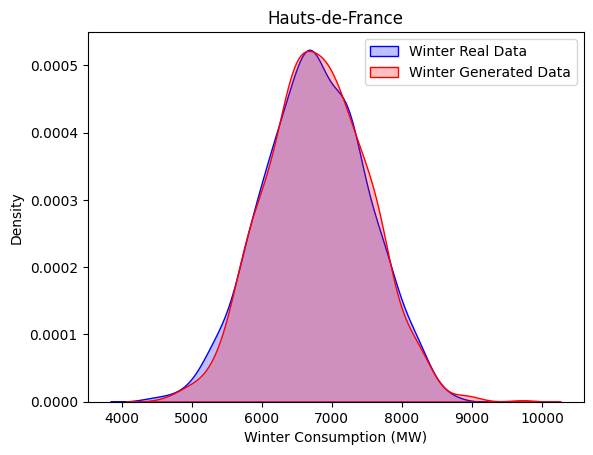

In [20]:
w_consumption_values = df[df.region == best_region][w_mask]['consumption']

w_n = len(w_consumption_values)

# Calculate the mean
w_mean = np.mean(w_consumption_values)

# Calculate the standard deviation
w_L = np.array(w_n*[w_mean])
w_variance = np.sum((w_consumption_values - w_L)**2)/(w_n - 1)
w_std_deviation = np.sqrt(w_variance)

print("The mean is: " + str(w_mean) + " , the standard deviation is: " + str(w_std_deviation))

# Generate new data
w_new_consumption_values = np.random.normal(np.array(w_n*[w_mean]),np.array(w_n*[w_std_deviation]))

# Real data
df_region_w = pd.DataFrame({'consumption': w_consumption_values})
sns.kdeplot(df_region_w, x="consumption", label="Winter Real Data", color='blue', fill=True)

# Generated data
df_region_w_generated = pd.DataFrame({'consumption': w_new_consumption_values})
sns.kdeplot(df_region_w_generated, x="consumption", label="Winter Generated Data", color='red', fill=True)

plt.title(best_region)
plt.xlabel("Winter Consumption (MW)")
plt.legend()
plt.show()

## C. Bayesian statistics

We would like to include prior knowledge on the estimation, using Bayesian statistics.

Consider the region Bretagne in winter. We focus on the mean $\mu$, assuming the standard deviation is known and equal to $\sigma=400$MW. We assume a Gaussian prior on $\mu$ with mean $\mu_0=3500$MW and standard deviation $\sigma_0=500$MW. 

1. Give the posterior distribution of $\mu$, using the parameters $\sigma$, $\mu_0$, $\sigma_0$ and the $n$ observations $x_1,\ldots,x_n$.

Your answer:

$$
\mu | X \sim \mathcal{N}\left( \frac{\mu_0 \sigma^2 + n \sigma_0^2 \bar{x}}{n \sigma_0^2 + \sigma^2}, \frac{\sigma_0^2 \sigma^2}{n\sigma_0^2 + \sigma^2} \right)
$$


2. Give the parameters of the posterior distribution obtained for each year from 2013 to 2023, considered independently, in a single dataframe.

In [21]:
sigma=400
mu_0=3500
sigma_0=500

def mean_b(X):
    n = len(X)
    S = 0
    for x in X:
        S += x
    return (mu_0*sigma**2 + (sigma_0**2)*S)/(n*(sigma_0**2) + sigma**2)

def sigma_b(X):
    n = len(X)
    return ((sigma_0*sigma)**2)/(n*(sigma_0**2)+sigma**2)

mean_tab=[]
sigma_tab=[]

for y in range(2013,2024):
    mask_y= ((df['date'].dt.year==y-1) & (df['date'].dt.month == 12) & (df['date'].dt.day >= 22)) | (df['date'].dt.year==y) & (df['date'].dt.month<3) | (df['date'].dt.month==3) & (df['date'].dt.day<=21) &(df['date'].dt.year==y)
    X=list(df_region[mask_y].consumption)

    mean_tab.append(mean_b(X))
    sigma_tab.append(sigma_b(X))

DataFrameB = pd.DataFrame(np.array([mean_tab,sigma_tab]), index = ["Mean","Variance"], columns = range(2013,2024))
DataFrameB.head()

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1731491928.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X=list(df_region[mask_y].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1731491928.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X=list(df_region[mask_y].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1731491928.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X=list(df_region[mask_y].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1731491928.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X=list(df_region[mask_y].consumption)
C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1731491928.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X=list(df_region[mask_y].consumption)
C:\Users\Pierre Marchetti

,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Mean,3395.176091,3095.134598,3229.578553,3133.762549,3275.816417,3328.695940,3179.931598,3124.061545,3360.657546,3216.041483,3061.154016
Variance,1984.126984,1765.225066,1765.225066,1745.962462,1765.225066,1765.225066,1765.225066,1745.962462,1765.225066,1765.225066,1765.225066


3. Plot the density of the posterior distribution in 2023 and the *kde* of real data in 2023 on the same plot.

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\571556066.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X = list(df_region[mask_y].consumption)


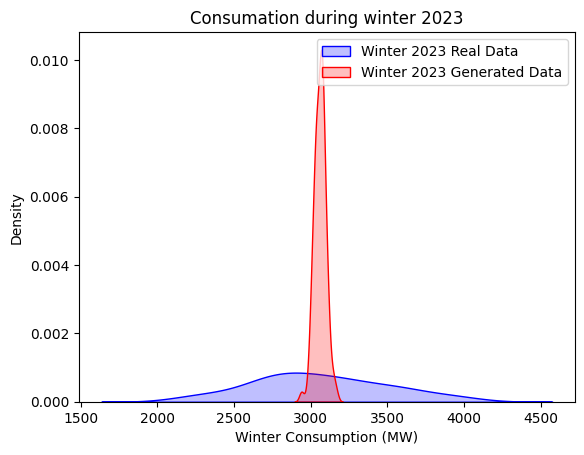

In [22]:
y = 2023
mask_y = ((df['date'].dt.year==y-1) & (df['date'].dt.month == 12) & (df['date'].dt.day >= 22)) | (df['date'].dt.year==y) & (df['date'].dt.month<3) | (df['date'].dt.month==3) & (df['date'].dt.day<=21) &(df['date'].dt.year==y)

X = list(df_region[mask_y].consumption)
n = len(X)
x_range = np.linspace(min(X),max(X),2000)

S = sigma_b(X)
M = mean_b(X)

X_generated=np.random.normal(np.array([M]*n),np.array([S**(1/2)]*n))

# Real data
df_X = pd.DataFrame({'consumption': X})
sns.kdeplot(df_X, x="consumption", label="Winter 2023 Real Data", color='blue', fill=True)

# Generated data
df_X_generated = pd.DataFrame({'consumption': X_generated})
sns.kdeplot(df_X_generated, x="consumption", label="Winter 2023 Generated Data", color='red', fill=True)

plt.title("Consumation during winter 2023")
plt.xlabel("Winter Consumption (MW)")
plt.legend()
plt.show()

4. Discuss the results, comparing to those obtained in part A.

Your answer:

## D. Hypothesis testing

Consider the region Bretagne. While the standard deviation is equal to 400MW in winter, you would like to test the hypothesis that it was 500MW in 2023. The mean is supposed to be known and equal to 3200MW.
1. Propose a statistical test at level $\alpha$.

Your answer:

Let's do a Neyman Pearson Test between $H_0$ : $\sigma^2 = \sigma_0^2 = 500MW^2$ and $H_1$ : $\sigma^2 \neq \sigma_0^2$

2. Provide the result of this test for $\alpha=1\%$.

In [23]:
alpha = 0.01
sigma = 500
mu = 3200

consumption_2023 = df_region[mask_y].consumption
n = len(consumption_2023)

chi2_threshold = chi2.ppf(alpha, n)

S = 0
for x in consumption_2023:
    S += (x - mu)**2

test_statistic = S/(sigma**2)

# Perform the test
if chi2_threshold < test_statistic:
    print("The hypothesis H0 is accepted.")
else:
    print("The hypothesis H0 is rejected.")

The hypothesis H0 is accepted.


C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\1531866942.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  consumption_2023 = df_region[mask_y].consumption


## E. Testing independence

Consider the power consumption in Bretagne and Provence-Alpes-Côte d'Azur in winter. 

1. Visualize the joint distribution of power consumption in these 2 regions using seaborn.

C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\4011005429.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data=df[paca_bretagne_mask][w_mask].pivot(index='date',columns='region',values='consumption')


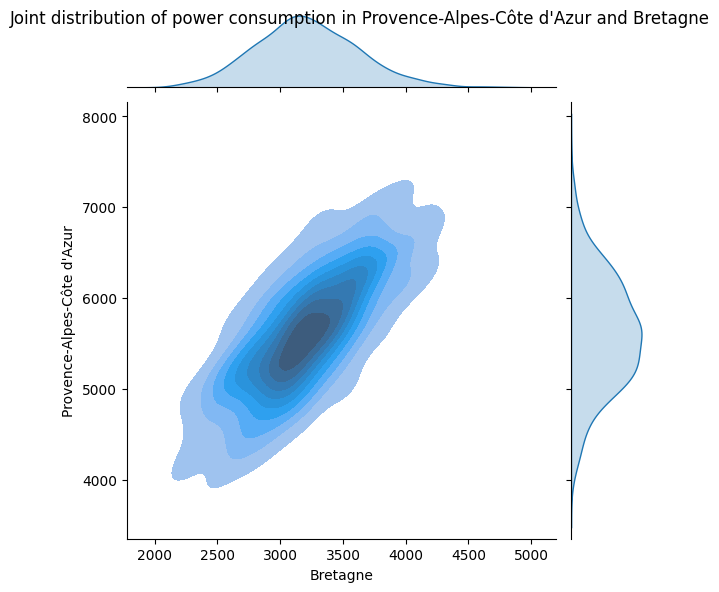

In [24]:
paca_bretagne_mask=(df["region"]=="Provence-Alpes-Côte d'Azur") | (df["region"]=="Bretagne")

data=df[paca_bretagne_mask][w_mask].pivot(index='date',columns='region',values='consumption')

sns.jointplot(data,kind='kde',x='Bretagne', y="Provence-Alpes-Côte d'Azur",fill=True)
plt.suptitle("Joint distribution of power consumption in Provence-Alpes-Côte d'Azur and Bretagne")
plt.show()

2. Do you think the power consumption in these two regions is independent?

Your answer: 

The graph shows a greater density in the center, as well as a direction, which would indicate a correlation between the two variables. However, it is difficult to conclude from this graph whether the power consumption in these two regions is independent.

3. Propose a chi-2 test for the independence of the power consumption in these two regions at level $\alpha$. 

Your answer:

4. Give the result of this test for $\alpha=1\%$. 

## F. Confidence intervals

Consider the region Bretagne in winter. 

1. Provide a confidence interval at level $\alpha=95\%$ for the mean power consumption. 

In [30]:
alpha = 0.95

consumption_values = list(df_region[w_mask].consumption)
n = len(consumption_values)

mean = np.mean(consumption_values)

L = np.array(n*[mean])
variance = np.sum((consumption_values - L)**2)/(n - 1)
std_deviation = np.sqrt(variance)

z_score = norm.ppf((alpha + 1)/2)

margin = std_deviation*(z_score/(n**(1/2)))

print("The confidence interval for alpha = 95 percent is ["+str(mean-margin) + ","+str(mean+margin) +"]")


The confidence interval for alpha = 95 percent is [3188.567522649083,3239.7888928295324]


C:\Users\Pierre Marchetti\AppData\Local\Temp\ipykernel_24832\3132854010.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  consumption_values = list(df_region[w_mask].consumption)


2. Give the result of a Student test at level $5\%$ for the null hypothesis that the mean consumption in 2023 is equal to 3100MW.